In [13]:
import os
import glob

import pydicom as pdm

import numpy as np
import torch
from PIL import Image
import cv2
from albumentations import Normalize
from segmentation_models_pytorch.unet import Unet

from tqdm.notebook import tqdm

import matplotlib.pyplot as plt
%matplotlib inline

plt.style.use('fivethirtyeight')
plt.show()

In [2]:
data_folder_path = r'../data/01_raw/osic-pulmonary-fibrosis-progression/test/ID00421637202311550012437'

In [3]:
data_files_path = sorted([os.path.join(data_folder_path, data_filename) for data_filename in os.listdir(data_folder_path)])

In [4]:
data_files_path

['../data/01_raw/osic-pulmonary-fibrosis-progression/test/ID00421637202311550012437\\1.dcm',
 '../data/01_raw/osic-pulmonary-fibrosis-progression/test/ID00421637202311550012437\\10.dcm',
 '../data/01_raw/osic-pulmonary-fibrosis-progression/test/ID00421637202311550012437\\11.dcm',
 '../data/01_raw/osic-pulmonary-fibrosis-progression/test/ID00421637202311550012437\\12.dcm',
 '../data/01_raw/osic-pulmonary-fibrosis-progression/test/ID00421637202311550012437\\13.dcm',
 '../data/01_raw/osic-pulmonary-fibrosis-progression/test/ID00421637202311550012437\\14.dcm',
 '../data/01_raw/osic-pulmonary-fibrosis-progression/test/ID00421637202311550012437\\15.dcm',
 '../data/01_raw/osic-pulmonary-fibrosis-progression/test/ID00421637202311550012437\\16.dcm',
 '../data/01_raw/osic-pulmonary-fibrosis-progression/test/ID00421637202311550012437\\17.dcm',
 '../data/01_raw/osic-pulmonary-fibrosis-progression/test/ID00421637202311550012437\\18.dcm',
 '../data/01_raw/osic-pulmonary-fibrosis-progression/test/ID0

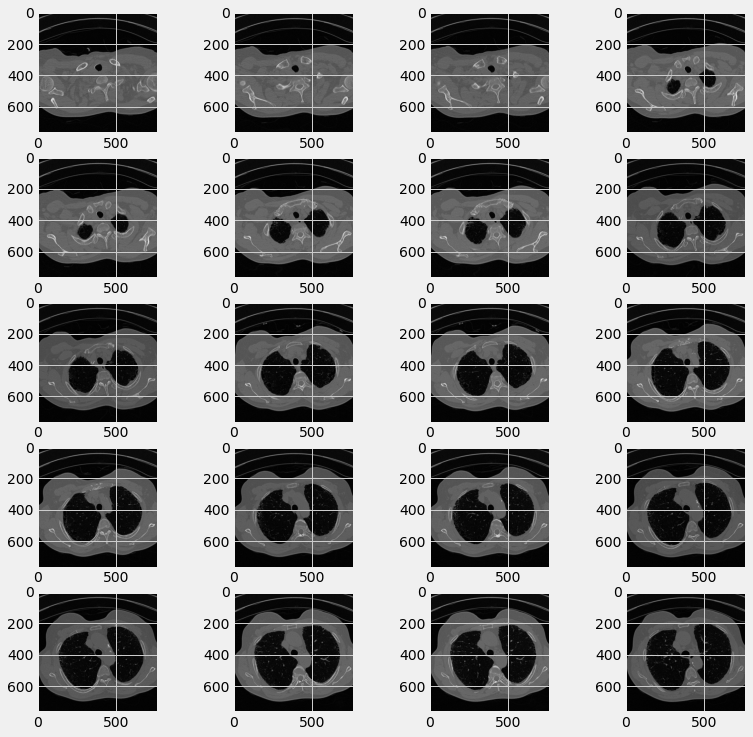

In [5]:
fig = plt.figure(figsize=(12, 12))
columns = 4
rows = 5
imglist = os.listdir(data_folder_path)
for i in range(columns*rows):
    filename = data_folder_path + "/" + str(i+1) + ".dcm"
    ds = pdm.dcmread(filename)
    fig.add_subplot(rows, columns, i+1)
    plt.imshow(ds.pixel_array, cmap='gray')
plt.show()

In [6]:
def get_shape(data_folder_path):
    data_shape = ()
    temp_dm_shape = ()
    
    filenames_list = os.listdir(data_folder_path)
    
    for img_name in filenames_list:
        dm = pdm.dcmread(os.path.join(data_folder_path, img_name))
        dm_shape = dm.pixel_array.shape
        if not temp_dm_shape:
            temp_dm_shape = dm_shape
        
        else:
            assert(temp_dm_shape == dm_shape)
        
    return (len(filenames_list), *dm_shape)

In [7]:
def convert_to_jpg(tensor, output_path=r'../data/02_intermediate', name='img', eps=1e-9):
    for i in range(tensor.shape[0]):
        im = tensor[i,:,:]

        im = (im.astype(np.float32) - im.min())*255.0 / (im.max()-im.min()) + eps  # https://www.kaggle.com/rashmibanthia/dicom-jpg
        im = im.astype(np.uint8)
        
        save_path_ = os.path.join(output_path, name + "_" + str(i) + ".jpg")
        _ = cv2.imwrite(save_path_, im)

tensor_shape = get_shape(data_folder_path)
tensor = np.zeros(tensor_shape, dtype=np.int16)

img_names = sorted(os.listdir(data_folder_path), key=lambda x: int(x[:-4]))  # img_name must be numbers

for i, img_name in enumerate(img_names):
    dm = pdm.dcmread(os.path.join(data_folder_path, img_name))
    tensor[i, :, :] = dm.pixel_array.astype(np.int16)        

convert_to_jpg(tensor)

In [8]:
images = []
predictions = []

img_folder_path = r'../data/02_intermediate'
img_names_list = [filename for filename in os.listdir(img_folder_path) if filename.endswith('jpg')]
img_names_list = sorted(img_names_list, key=lambda x: int(x[4:-4]))

DEVICE = 'cpu'
model_weights_path = r'C:\Users\ALM\PycharmProjects\dicom-segmentation\data\06_models\best_model.pth'

model = Unet('efficientnet-b2', encoder_weights="imagenet", classes=3, activation=None)
model.load_state_dict(torch.load(model_weights_path, map_location=DEVICE))

model.eval()

sigmoid = lambda x: 1 / (1 + np.exp(-x))
threshold = 0.3

for img_name in tqdm(img_names_list):
    img_ = cv2.imread(os.path.join(img_folder_path, img_name))
    
    img = Normalize().apply(img_)
    tensor = torch.FloatTensor(img).permute(2, 0, 1).unsqueeze(0)
    prediction = model.forward(tensor.to(DEVICE))
    prediction = prediction.cpu().detach().numpy()
    prediction = prediction.squeeze(0).transpose(1, 2, 0)
    prediction = sigmoid(prediction)
    prediction = (prediction >= threshold).astype(np.float32)

    predictions.append((prediction * 255).astype("uint8"))
    images.append(img_)

  0%|          | 0/62 [00:00<?, ?it/s]

In [9]:
def get_overlaid_masks_on_image(
                one_slice_image: np.ndarray,
                one_slice_mask: np.ndarray, 
                w: float = 512,
                h: float = 512, 
                dpi: float = 100,
                write: bool = False,
                path_to_save: str = '/content/',
                name_to_save: str = 'img_name'):
    """overlap masks on image and save this as a new image."""

    path_to_save_ = os.path.join(path_to_save, name_to_save)
    lung, heart, trachea = [one_slice_mask[:, :, i] for i in range(3)]
    figsize = (w / dpi), (h / dpi)
    fig = plt.figure(figsize=(figsize))
    fig.add_axes([0, 0, 1, 1])
 
    # image
    plt.imshow(one_slice_image, cmap="bone")

    # overlaying segmentation masks
    plt.imshow(np.ma.masked_where(lung == False, lung),
            cmap='cool', alpha=0.3)
    plt.imshow(np.ma.masked_where(heart == False, heart),
            cmap='autumn', alpha=0.3)
    plt.imshow(np.ma.masked_where(trachea == False, trachea),
               cmap='autumn_r', alpha=0.3) 

    fig.axes[0].get_xaxis().set_visible(False)
    fig.axes[0].get_yaxis().set_visible(False)
    

    fig.savefig(f"{path_to_save_}.png",bbox_inches='tight', pad_inches=0, dpi=dpi,  format="png")
    
    if write:
        plt.close()
    else:
        plt.show()

C:\Users\ALM\anaconda3\envs\dicom_segmentation\lib\site-packages\matplotlib\image.py:443: UserWarning: Warning: converting a masked element to nan.
  dv = np.float64(self.norm.vmax) - np.float64(self.norm.vmin)
C:\Users\ALM\anaconda3\envs\dicom_segmentation\lib\site-packages\matplotlib\image.py:444: UserWarning: Warning: converting a masked element to nan.
  vmid = np.float64(self.norm.vmin) + dv / 2


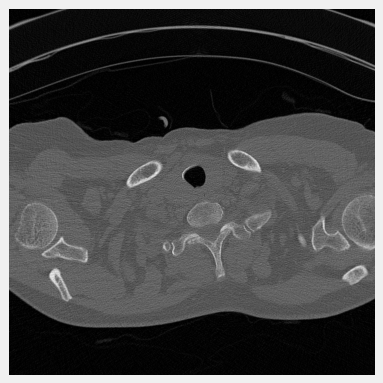

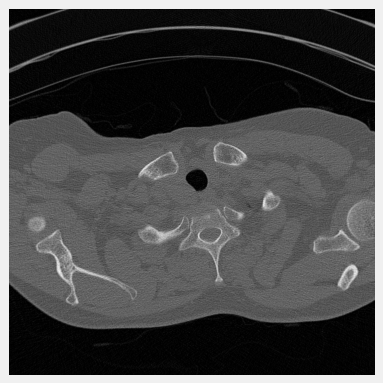

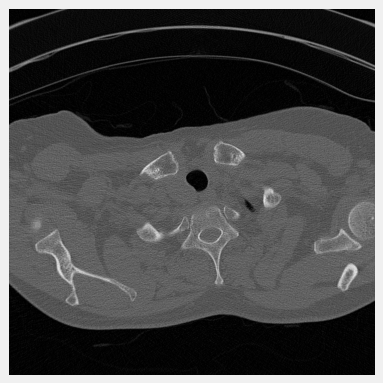

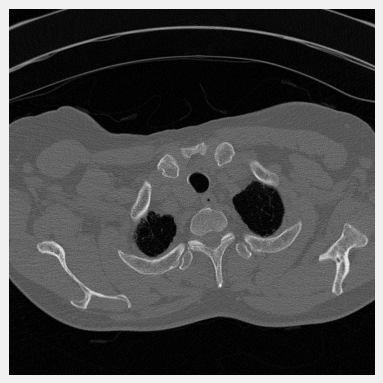

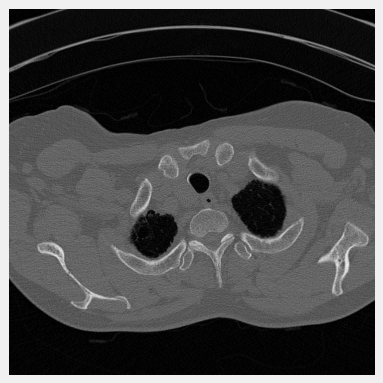

...

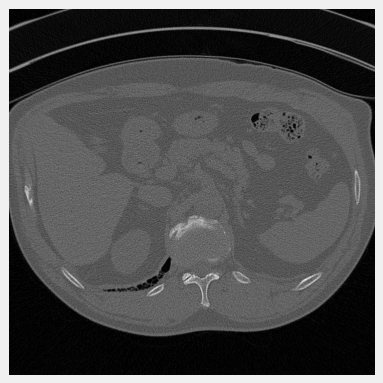

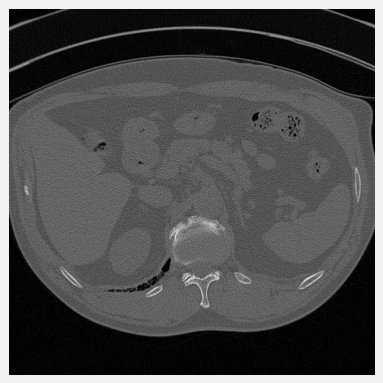

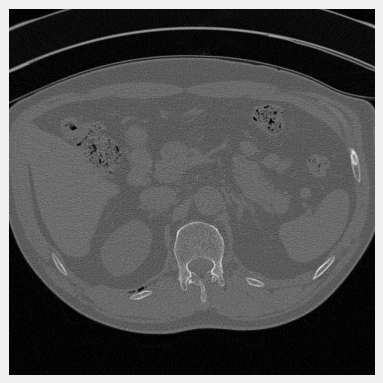

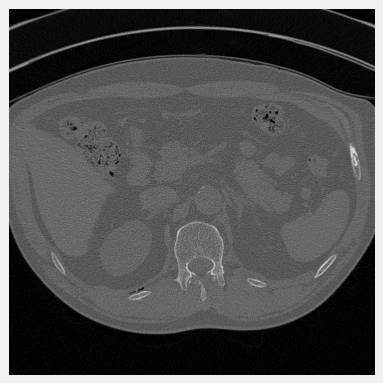

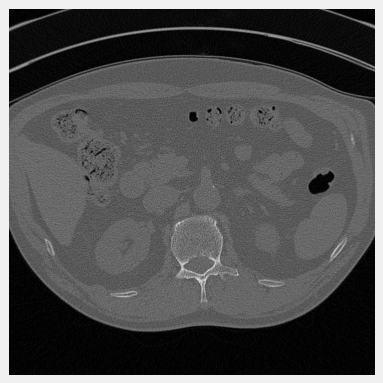

In [10]:
for i, (image, prediction) in enumerate(zip(images, predictions)):
    get_overlaid_masks_on_image(image, prediction, 
                            path_to_save=r'C:\Users\ALM\PycharmProjects\dicom-segmentation\data\07_model_output',
                            name_to_save=str(i))

In [11]:
# video_name = 'output'
# framerate = 10

# img_folder_path = r'C:\Users\ALM\PycharmProjects\dicom-segmentation\data\07_model_output'
# img_names_list = [filename for filename in os.listdir(img_folder_path) if filename.endswith('png')]

# img_names = sorted(img_names_list, key=lambda x: int(x[:-4]))  # img_name must be numbers
# img_path = os.path.join(r'C:\Users\ALM\PycharmProjects\dicom-segmentation\data\07_model_output', img_names[0])
# frame_width, frame_height, _ = cv2.imread(img_path).shape
# fourc = cv2.VideoWriter_fourcc(*'MP4V')           ## MP4V - dont work in kaggle kernel
# video = cv2.VideoWriter(video_name + ".mp4",      ##'mp4' 
#                             fourc, 
#                             framerate, 
#                             (frame_width, frame_height))

# for img_name in img_names:
#     img_path = os.path.join(img_folder_path, img_name)
#     image = cv2.imread(img_path)
#     video.write(image)
            
# # cv2.destroyAllWindows()
# video.release()

In [22]:
fp_in = r'C:\Users\ALM\PycharmProjects\dicom-segmentation\data\07_model_output\*.png'
fp_out = r'C:\Users\ALM\PycharmProjects\dicom-segmentation\data\07_model_output\output.gif'


img, *imgs = [Image.open(f) for f in sorted(glob.glob(fp_in), key=lambda x: int(x.split('\\')[-1][:-4]))]
img.save(fp=fp_out, format='GIF', append_images=imgs,
         save_all=True, duration=200, loop=0)

In [28]:
ds.filename.split('/')[-1][:-4]

'20'

In [29]:
def convert_to_jpg2(dcm, output_path, img_name, eps=1e-9):

    im = dcm.pixel_array
    im = (im.astype(np.float32) - im.min()) * 255.0 / (im.max() - im.min()) + eps
    im = im.astype(np.uint8)

    save_path_ = os.path.join(output_path, img_name + ".jpg")
    _ = cv2.imwrite(save_path_, im)

    return None

In [30]:
convert_to_jpg2(ds, r'C:\Users\ALM\PycharmProjects\dicom-segmentation\data\07_model_output', 'test')